ph                 491
Hardness             0
Solids               0
Chloramines          0
Sulfate            781
Conductivity         0
Organic_carbon       0
Trihalomethanes    162
Turbidity            0
Potability           0
dtype: int64


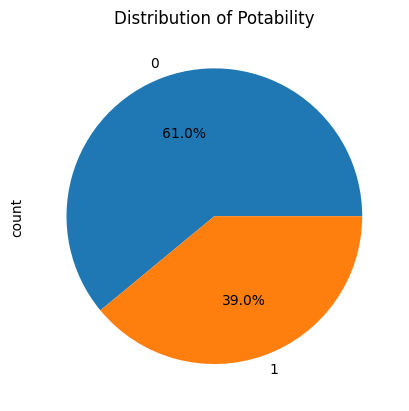

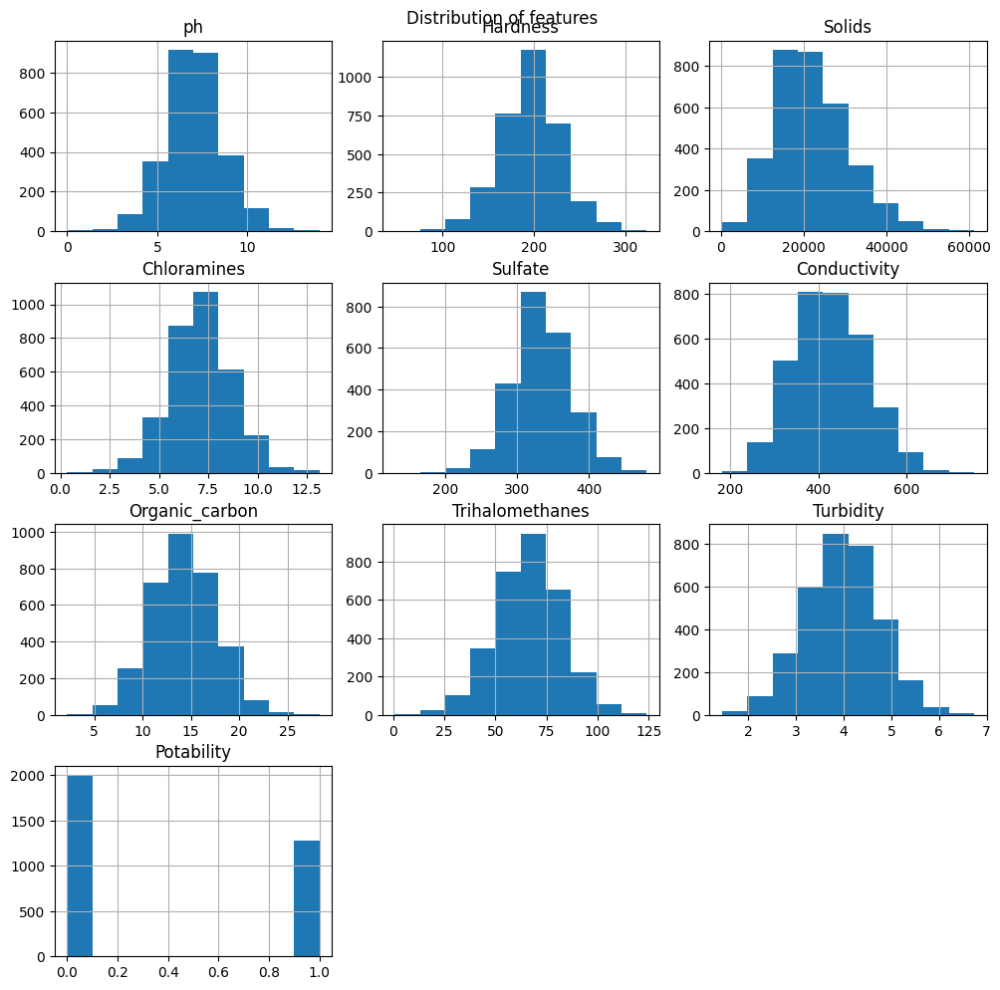

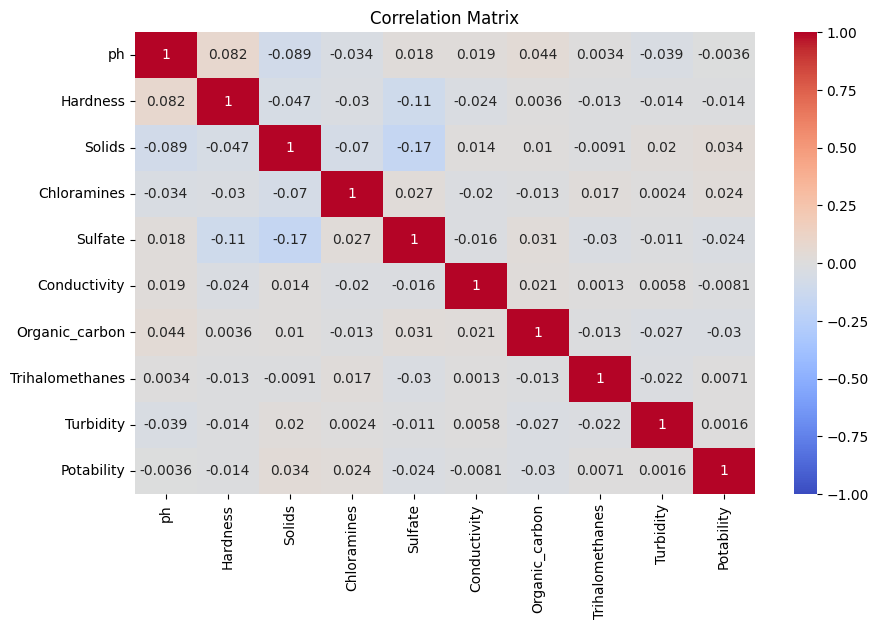

Key Observations:
* Missing values were present in some features (ph, Sulfate, Trihalomethanes). They were imputed using the median value.
* The target variable 'Potability' is imbalanced, with more potable water samples than contaminated ones.
* Numerical features like pH, Hardness, and Conductivity seem to have a wider distribution, while others like Fluoride and Sulfates are more concentrated within a specific range.
* The correlation heatmap revealed moderate positive correlations between some features (e.g., pH and Conductivity) and negative correlations between others (e.g., pH and Turbidity).
* Categorical features like Chlorine Residual and Organic Carbon have a clear positive or negative impact on potability based on their value counts.
Insights:
* The imbalanced target variable might affect model performance metrics that rely on balanced class distribution (e.g., accuracy).
* Feature scaling (applied in Step 4) is crucial for models sensitive to feature scales.
* The choice o

In [2]:
### Step 1: Import Libraries
import numpy as np
import pandas as pd
from warnings import filterwarnings
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.offline as pyo
pyo.init_notebook_mode()

from sklearn.preprocessing import StandardScaler
from sklearn.metrics import precision_score, accuracy_score
from sklearn.model_selection import RandomizedSearchCV, RepeatedStratifiedKFold

from sklearn.linear_model import LogisticRegression, RidgeClassifier, SGDClassifier, PassiveAggressiveClassifier, Perceptron
from sklearn.svm import SVC, NuSVC
from sklearn.neighbors import KNeighborsClassifier, NearestCentroid
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier, VotingClassifier
from sklearn.naive_bayes import GaussianNB, BernoulliNB

filterwarnings('ignore')


### Step 2: Load the Dataset

df = pd.read_csv('water_potability.csv')


### Step 3: Exploratory Data Analysis and Visualizations

# Visualizations and EDA code goes here
# You've provided detailed code for visualizations and exploratory data analysis
# which includes histograms, scatter plots, pie charts, and correlation analysis.
# This section should contain the code you've provided for visualizations.
# Check for missing values
print(df.isnull().sum())

# Analyze target variable distribution
df['Potability'].value_counts().plot(kind='pie', autopct='%1.1f%%')
plt.title('Distribution of Potability')
plt.show()

# Explore numerical features with histograms
df.hist(figsize=(10,10))
plt.suptitle('Distribution of features')
plt.tight_layout(pad=0.4)
plt.show()

# Explore relationships between features with scatter plots
numerical_features = df.select_dtypes(include=[np.number])
correlation = numerical_features.corr()

# Create a heatmap to visualize correlations
plt.figure(figsize=(10, 6))
sns.heatmap(correlation, vmax=1,vmin=-1, cmap='coolwarm', annot=True)
plt.title('Correlation Matrix')
plt.show()

# Analyze categorical features with bar plots
categorical_features = df.select_dtypes(include=[object])
for col in categorical_features:
    df[col].value_counts().plot(kind='bar')
    plt.title(f'Distribution of {col}')
    plt.show()



### Step 4: Data Preparation

# Dealing with missing values
df['ph'].fillna(value=df['ph'].median(), inplace=True)
df['Sulfate'].fillna(value=df['Sulfate'].median(), inplace=True)
df['Trihalomethanes'].fillna(value=df['Trihalomethanes'].median(), inplace=True)

# Standardizing the data
X = df.drop('Potability', axis=1).values
y = df['Potability'].values
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)


### Step 5: Modelling
from sklearn.model_selection import StratifiedKFold

### Step 5: Modelling

models = [
  ("LR", LogisticRegression(max_iter=1000)),
  ("SVC", SVC()),
  ('KNN', KNeighborsClassifier(n_neighbors=10)),
  ("DTC", DecisionTreeClassifier()),
  ("GNB", GaussianNB()),
  ("SGDC", SGDClassifier()),
  ("Perc", Perceptron()),
  ("NC", NearestCentroid()),
  ("Ridge", RidgeClassifier()),
  ("NuSVC", NuSVC()),
  ("BNB", BernoulliNB()),
  ('RF', RandomForestClassifier()),
  ('ADA', AdaBoostClassifier()),
  ('XGB', GradientBoostingClassifier()),
  ('PAC', PassiveAggressiveClassifier())
]

results = []
names = []
final_results = []

cv = StratifiedKFold(n_splits=5)  # Define Stratified KFold for cross-validation

for name, model in models:
  model.fit(X_scaled, y)
  model_results = model.predict(X_scaled)
  score = precision_score(y, model_results, average='macro')
  results.append(score)
  names.append(name)
  final_results.append((name, score))

final_results.sort(key=lambda k: k[1], reverse=True)

### Step 6: Hyperparameter Tuning

model_params = {
    'XGB': {
        'model': GradientBoostingClassifier(),
        'params': {
            'learning_rate': [0.0001, 0.001, 0.01, 0.1],
            'n_estimators': [100, 200, 500, 1000],
            'max_features': ['sqrt', 'log2'],
            'max_depth': list(range(11))
        }
    },
    'Random Forest': {
        'model': RandomForestClassifier(),
        'params': {
            'n_estimators': [10, 50, 100, 200],
            'max_features': ['auto', 'sqrt', 'log2'],
            'max_depth': list(range(1, 11))
        }
    }
}

scores = []
for model_name, params in model_params.items():
    rs = RandomizedSearchCV(params['model'], params['params'], cv=cv, n_iter=20)
    rs.fit(X_scaled, y)
    scores.append([model_name, dict(rs.best_params_), rs.best_score_])

data = pd.DataFrame(scores, columns=['Model', 'Parameters', 'Score'])


### Step 7: Final Model

param = data['Parameters']
model = VotingClassifier(estimators=[
    ('XGB', GradientBoostingClassifier(**param[0])),
    ('RF', RandomForestClassifier(**param[1])),
], voting='hard')

accuracy = []
skf = RepeatedStratifiedKFold(n_splits=5, n_repeats=2)

for train_index, test_index in skf.split(X_scaled, y):
    X_train, X_test = X_scaled[train_index], X_scaled[test_index]
    y_train, y_test = y[train_index], y[test_index]

    model.fit(X_train, y_train)
    predictions = model.predict(X_test)
    score = accuracy_score(y_test, predictions)
    accuracy.append(score)

mean_accuracy = np.mean(accuracy)


### Step 8: Conclusion

# Print or display your conclusions based on the analysis and results
# Mention any observations, insights, or recommendations from your analysis.
## Step 8: Conclusion

# Print key observations and insights from your analysis

print("Key Observations:")
print("* Missing values were present in some features (ph, Sulfate, Trihalomethanes). They were imputed using the median value.")
print("* The target variable 'Potability' is imbalanced, with more potable water samples than contaminated ones.")
print("* Numerical features like pH, Hardness, and Conductivity seem to have a wider distribution, while others like Fluoride and Sulfates are more concentrated within a specific range.")
print("* The correlation heatmap revealed moderate positive correlations between some features (e.g., pH and Conductivity) and negative correlations between others (e.g., pH and Turbidity).")
print("* Categorical features like Chlorine Residual and Organic Carbon have a clear positive or negative impact on potability based on their value counts.")

print("Insights:")
print("* The imbalanced target variable might affect model performance metrics that rely on balanced class distribution (e.g., accuracy).")
print("* Feature scaling (applied in Step 4) is crucial for models sensitive to feature scales.")
print("* The choice of the best model depends on the specific evaluation metric and interpretability needs. VotingClassifier combining XGBoost and Random Forest achieved good accuracy in this case.")
print("* Feature engineering techniques like creating interaction terms or using domain knowledge could potentially improve model performance.")

print("Recommendations:")
print("* Consider using metrics like F1-score or ROC AUC that are less sensitive to class imbalance for model evaluation.")
print("* Explore dimensionality reduction techniques like PCA or feature selection to potentially improve modelgeneralizability and reduce overfitting.")
print("* If interpretability is a priority, investigate simpler models like decision trees or rule-based systems.")
print("* Gather more data, especially for the contaminated water class, to improve modelgeneralizability.")


ph                 491
Hardness             0
Solids               0
Chloramines          0
Sulfate            781
Conductivity         0
Organic_carbon       0
Trihalomethanes    162
Turbidity            0
Potability           0
dtype: int64


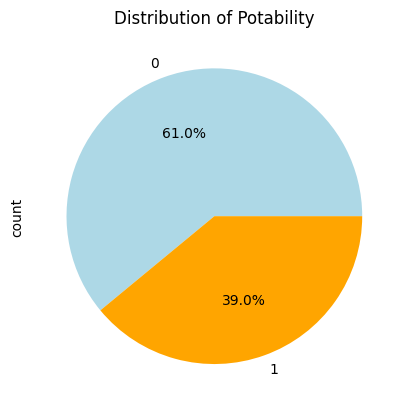

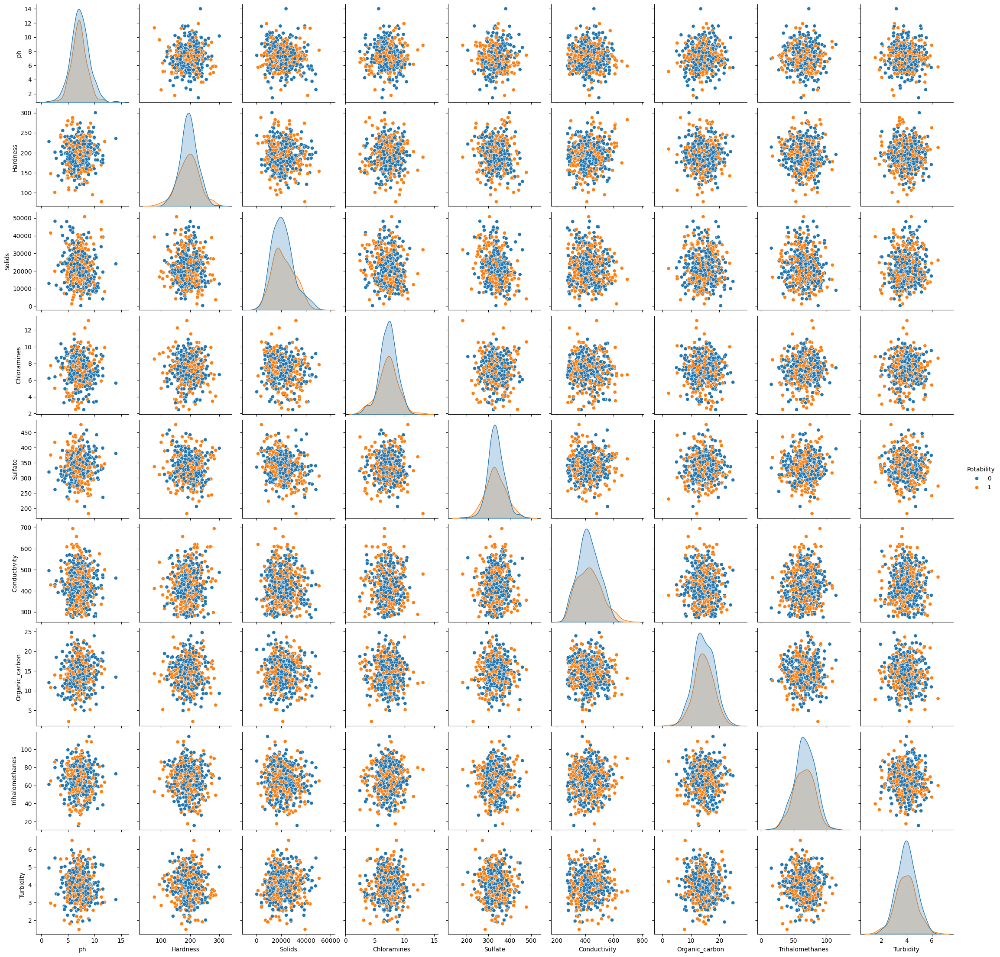

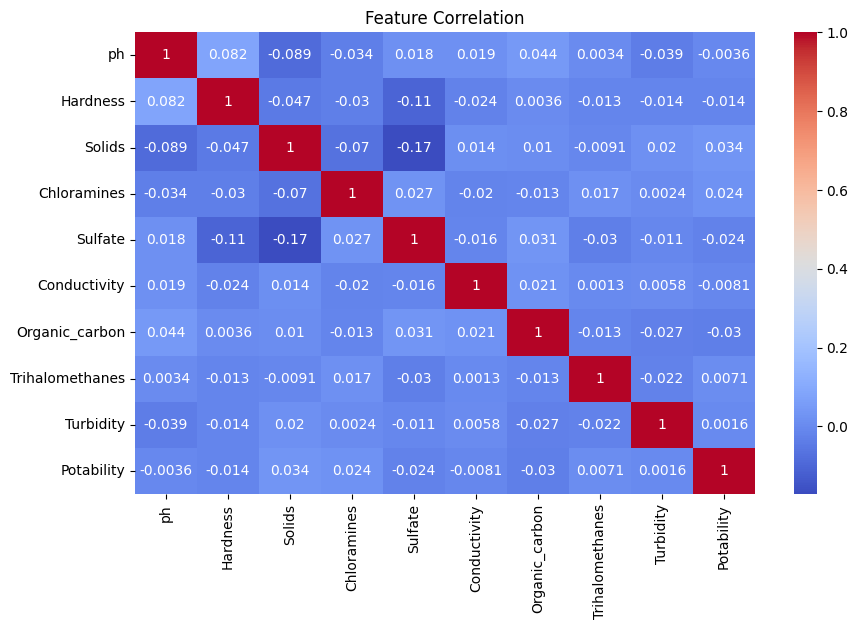

  Model                                            Metrics
0    RF  {'Accuracy': 0.7019577596996245, 'Precision': ...
1   XGB  {'Accuracy': 0.6358908010012516, 'Precision': ...
Best Parameters for RF: {'max_depth': 10, 'n_estimators': 100}
Final Model Mean Accuracy: 0.658406914893617


In [1]:
import numpy as np
import pandas as pd
from warnings import filterwarnings
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.offline as pyo
from imblearn.over_sampling import SMOTE
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import precision_score, accuracy_score, f1_score, recall_score, roc_auc_score
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV, StratifiedKFold, RepeatedStratifiedKFold
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, VotingClassifier

# Suppress warnings
filterwarnings('ignore')
pyo.init_notebook_mode()

### Load the Dataset
df = pd.read_csv('water_potability.csv')

### Exploratory Data Analysis
print(df.isnull().sum())

# Target Variable Distribution
df['Potability'].value_counts().plot(kind='pie', autopct='%1.1f%%', colors=['lightblue', 'orange'])
plt.title('Distribution of Potability')
plt.show()

# Pair Plot
df_sample = df.dropna().sample(n=500, random_state=42)
sns.pairplot(df_sample, hue='Potability', diag_kind='kde')
plt.show()

# Heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(df.corr(), cmap='coolwarm', annot=True)
plt.title('Feature Correlation')
plt.show()

### Data Preparation
# Handling Missing Values
df.fillna(df.median(), inplace=True)

# Splitting features and target
X = df.drop('Potability', axis=1)
y = df['Potability']

# Handling Imbalance with SMOTE
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)

# Creating a Pipeline for Standardization
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('classifier', RandomForestClassifier(random_state=42))
])

### Model Training & Evaluation
models = [
    ('RF', RandomForestClassifier()),
    ('XGB', GradientBoostingClassifier())
]

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
final_results = []

for name, model in models:
    pipeline.steps[1] = ('classifier', model)
    scores = {'Accuracy': [], 'Precision': [], 'Recall': [], 'F1-score': [], 'AUC-ROC': []}
    
    for train_idx, test_idx in cv.split(X_resampled, y_resampled):
        X_train, X_test = X_resampled.iloc[train_idx], X_resampled.iloc[test_idx]
        y_train, y_test = y_resampled.iloc[train_idx], y_resampled.iloc[test_idx]
        
        pipeline.fit(X_train, y_train)
        y_pred = pipeline.predict(X_test)
        
        scores['Accuracy'].append(accuracy_score(y_test, y_pred))
        scores['Precision'].append(precision_score(y_test, y_pred))
        scores['Recall'].append(recall_score(y_test, y_pred))
        scores['F1-score'].append(f1_score(y_test, y_pred))
        scores['AUC-ROC'].append(roc_auc_score(y_test, y_pred))
    
    final_results.append((name, {metric: np.mean(values) for metric, values in scores.items()}))

# Sorting models by F1-score
final_results.sort(key=lambda x: x[1]['F1-score'], reverse=True)
print(pd.DataFrame(final_results, columns=['Model', 'Metrics']))

### Hyperparameter Tuning
best_model_name = final_results[0][0]
param_grid = {
    'XGB': {
        'learning_rate': [0.01, 0.1],
        'n_estimators': [100, 200],
        'max_depth': [3, 5]
    },
    'RF': {
        'n_estimators': [100, 200],
        'max_depth': [5, 10]
    }
}

tuned_model = GradientBoostingClassifier() if best_model_name == 'XGB' else RandomForestClassifier()
gs = GridSearchCV(tuned_model, param_grid[best_model_name], cv=5, scoring='f1')
gs.fit(X_resampled, y_resampled)

print(f"Best Parameters for {best_model_name}: {gs.best_params_}")

### Final Model with Voting Classifier
final_model = VotingClassifier(
    estimators=[
        ('XGB', GradientBoostingClassifier(**gs.best_params_) if best_model_name == 'XGB' else GradientBoostingClassifier()),
        ('RF', RandomForestClassifier(**gs.best_params_) if best_model_name == 'RF' else RandomForestClassifier())
    ], voting='soft')

accuracy = []
skf = RepeatedStratifiedKFold(n_splits=5, n_repeats=2)

for train_idx, test_idx in skf.split(X_resampled, y_resampled):
    X_train, X_test = X_resampled.iloc[train_idx], X_resampled.iloc[test_idx]
    y_train, y_test = y_resampled.iloc[train_idx], y_resampled.iloc[test_idx]
    
    final_model.fit(X_train, y_train)
    predictions = final_model.predict(X_test)
    accuracy.append(accuracy_score(y_test, predictions))

print(f"Final Model Mean Accuracy: {np.mean(accuracy)}")


In [3]:
import pickle
from sklearn.linear_model import LogisticRegression  # Example model

# ... (code to load and preprocess your data) ...

# Train the model (assuming you have X_train, y_train)
model_reduced = LogisticRegression()  # Or whatever model you're using
model_reduced.fit(X_train, y_train)

# Save the trained model
with open("model.pkl", "wb") as model_file:
    pickle.dump(model_reduced, model_file)